<a href="https://colab.research.google.com/github/Jolanta27/AI-course/blob/master/agd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
uploaded = files.upload()

Saving agd.csv to agd.csv


In [2]:
import pandas as pd
df = pd.read_csv("agd.csv")
df.sample(10)

,name,url,rating,opinions,opinion_score,opinion_text,opinion_type
8135,Bosch KIS38A51,/opinie-70479-bosch-kis-38a51.html,3.4,(68 opinii),1.0,Odradzam szczerze tą lodówkę. Na początku cich...,negatywne
16044,Philips HD4683,/opinie-64028-philips-hd-4683.html,3.5,(35 opinii),1.0,Czajnik działał bez zarzutu przez dwa lata ale...,negatywne
2141,Braun MR 570 FP K HC,/opinie-83771167-braun-mr-570-fp-k-hc.html,4.5,(165 opinii),1.0,"Kupiłem swego czasu cały zestaw, po jakimś cza...",pozytyne
2662,Remington D5220,/opinie-6238902-remington-d5220.html,4.5,(147 opinii),5.0,Bardzo fajna poręczna suszarka o dużej mocy na...,pozytyne
361,Zelmer Aquos 829.0 ST / ZVC722ST,/opinie-531452353-zelmer-aquos-829-0-st-zvc722...,4.3,(451 opinii),1.0,aquos zelmer . miałem jeden . równo po 25 mies...,pozytyne
8186,Amica AWST 10L,/opinie-76572-amica-awst-10l.html,3.7,(68 opinii),1.0,Omijajcie z daleka! Mój egzemplarz ma pół roku...,negatywne
5371,Bosch WAA20163PL,/opinie-77070-bosch-waa20163pl.html,3.7,(91 opinii),5.0,Chociaż zdecydowałam się na zakup pralki troch...,pozytyne
3103,Bosch SPS53E08EU,/opinie-313107984-bosch-sps53e08eu.html,4.5,(132 opinie),5.0,"Zmywarka pracuj od 3 tygodni, jest cicha, bard...",pozytyne
10551,Philips GC4740,/opinie-576362-philips-gc-4740-02.html,4.4,(53 opinie),5.0,Bardzo dobra jakość .,pozytyne
8990,Beko CSA 24022,/opinie-69005-beko-csa-24022.html,2.9,(63 opinie),1.0,"lodówka dramat, mamy ja dwa miesiace już trzy ...",pozytyne


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17390 entries, 0 to 17389
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           17390 non-null  object 
 1   url            17390 non-null  object 
 2   rating         17390 non-null  float64
 3   opinions       17390 non-null  object 
 4   opinion_score  17390 non-null  float64
 5   opinion_text   17388 non-null  object 
 6   opinion_type   17390 non-null  object 
dtypes: float64(2), object(5)
memory usage: 951.1+ KB


In [4]:
df = df[df["opinion_score"].notnull()]

In [5]:
df = df[df["opinion_text"].notnull()]

In [6]:
df = df[df["opinion_text"] != '']

In [7]:
def f(text):
  return any(x.isupper() for x in text.split())

In [8]:
tmp = df[df["opinion_text"].map(f)]

In [9]:
tmp[tmp['opinion_type'] == 'pozytyne']

,name,url,rating,opinions,opinion_score,opinion_text,opinion_type
20,Philips Azur GC4410/02,/opinie-293202840-philips-gc4410.html,4.5,(1127 opinii),5.0,"doskonale prasuje, długi kabel, POLECAM\n\nZal...",pozytyne
38,Zelmer 450.0 ST / ZVC302 ST Odyssey,/opinie-72201-zelmer-450-0-st.html,4.5,(940 opinii),4.0,Odkurzacz godny polecenia jeżeli chodzi o ten ...,pozytyne
39,Zelmer 450.0 ST / ZVC302 ST Odyssey,/opinie-72201-zelmer-450-0-st.html,4.5,(940 opinii),5.0,Witam prowadzę firmę o profilu motoryzacyjnym ...,pozytyne
57,Bosch MKM6003,/opinie-266735541-bosch-mkm6003.html,4.4,(838 opinii),5.0,Ach ten zapach! Aby poczuć wreszcie smak prawd...,pozytyne
62,Bosch MKM6003,/opinie-266735541-bosch-mkm6003.html,4.4,(838 opinii),5.0,Wszystko O.K.,pozytyne
...,...,...,...,...,...,...,...
17360,Bosch HMT84G451,/opinie-68197-bosch-hmt84g451.html,4.2,(32 opinie),4.0,"Produkt posiadam od kilku dni, na razie spisuj...",pozytyne
17362,Bosch HMT84G451,/opinie-68197-bosch-hmt84g451.html,4.2,(32 opinie),4.0,OK\n\nZalety: cena | cena/jakość,pozytyne
17369,Bosch HMT84G451,/opinie-68197-bosch-hmt84g451.html,4.2,(32 opinie),4.0,Kuchenkę kupiłam wybierając producenta i funkc...,pozytyne
17375,Camry CR111,/opinie-65837-camry-cr-111.html,4.1,(32 opinie),5.0,PRODUKT REWELACYJNY,pozytyne


In [10]:
# Przetwarzanie tekstu
df = df.dropna(subset=['opinion_text'])  # Usunięcie wartości null w kolumnie opinion_text
text = ' '.join(df['opinion_text'].tolist())

In [11]:
!pip install wordcloud

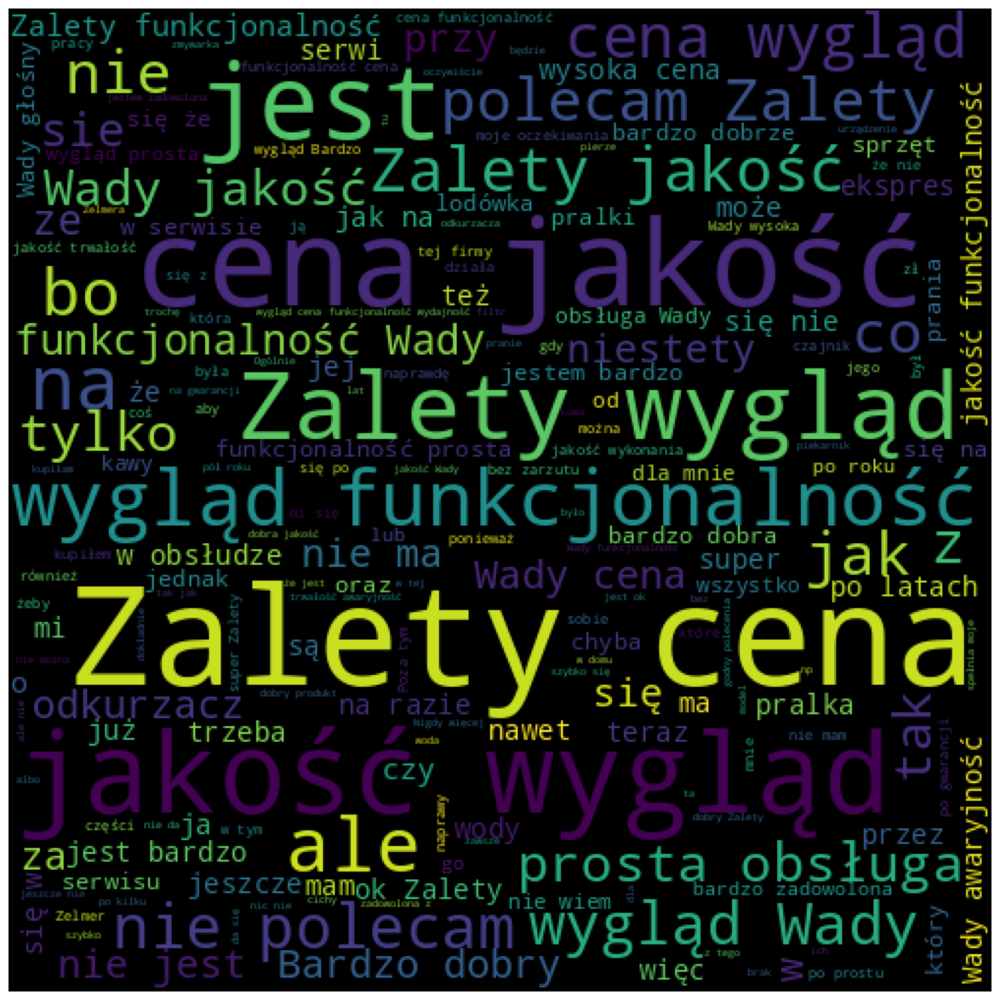

In [12]:
from wordcloud import WordCloud
from matplotlib import pyplot as plt

wordcloud = WordCloud(width=500, height=500).generate(' '.join(df['opinion_text']))

plt.figure(figsize = (15,15))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


**DATA PROCESSING**

In [13]:
X=df['opinion_text']
y=df['opinion_score']

In [14]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y, test_size=0.2)

In [15]:
from collections import Counter

n = 1000
most_common_words = Counter(' '.join(df['opinion_text'].dropna().astype(str)).lower().split()).most_common(n)

In [16]:
texts = ['ala ma kota', 'ela Ma psa', 'krzysiu ma hipopotama']

In [17]:
raw_text = ' '.join(texts)

In [18]:
raw_text_lower = raw_text.lower()

In [19]:
raw_text_lower_splits = raw_text_lower.split()

In [20]:
df['opinion_text'].dropna().astype(str)

,opinion_text
0,"Użytkuję żelazko ok.5 lat. Niestety, ale z per..."
1,Zakupiłam model GC 4410/22 firmy Philips. Stop...
2,"Mam za sobą ponad 50 tys wyprasowanych koszul,..."
3,Kupilem je w Media wraz ze specjalna woda do z...
4,Nie polecam
...,...
17385,Produkt używam za krótko aby obiektywnie go oc...
17386,polecam\n\nZalety: funkcjonalność
17387,Produkt bardzo dobrze się spisuje.
17388,produkt ok.


In [21]:
text_series = pd.Series(' '.join(X_train).lower().split()).value_counts()[:n]

In [22]:
df['opinion_type'].value_counts().index

Index(['pozytyne', 'negatywne'], dtype='object', name='opinion_type')

In [23]:
l = ['a', 'b', 'c']
for index, letter in enumerate(l):
  print(index, letter)

0 a
1 b
2 c


In [24]:
word_dict = {}
for i, word in enumerate(text_series.index):
  word_dict[word] = i

In [25]:
word_dict

{'|': 0,
 'nie': 1,
 'i': 2,
 'w': 3,
 'zalety:': 4,
 'się': 5,
 'na': 6,
 'z': 7,
 'to': 8,
 'wygląd': 9,
 'jest': 10,
 'do': 11,
 'cena': 12,
 'po': 13,
 'jakość': 14,
 'wady:': 15,
 'bardzo': 16,
 'funkcjonalność': 17,
 'że': 18,
 'jak': 19,
 '-': 20,
 'a': 21,
 'ale': 22,
 'za': 23,
 'od': 24,
 'co': 25,
 'polecam': 26,
 'ma': 27,
 'mam': 28,
 'o': 29,
 'sie': 30,
 'tego': 31,
 'już': 32,
 'bo': 33,
 'tak': 34,
 'przy': 35,
 'tylko': 36,
 'produkt': 37,
 'jestem': 38,
 'ze': 39,
 'tym': 40,
 'tej': 41,
 'bez': 42,
 'ten': 43,
 '2': 44,
 'pralka': 45,
 'obsługa': 46,
 'prosta': 47,
 'awaryjność': 48,
 'mi': 49,
 'go': 50,
 ',': 51,
 'dobrze': 52,
 'trzeba': 53,
 'przez': 54,
 'odkurzacz': 55,
 '3': 56,
 'super': 57,
 'dla': 58,
 'mnie': 59,
 'dobry': 60,
 'niestety': 61,
 'można': 62,
 'są': 63,
 'wszystko': 64,
 'ok': 65,
 'jeszcze': 66,
 'roku': 67,
 'nawet': 68,
 'czy': 69,
 'cena/jakość': 70,
 'głośny': 71,
 'gwarancji': 72,
 '.': 73,
 'dobra': 74,
 'nic': 75,
 'serwis': 76,
 'm

In [26]:
def word_to_index(text):
  return [word_dict[word] for word in text.lower().split() if word in word_dict]

In [27]:
word_to_index('Produkt bardzo dobry dsfdfgdsg')

[37, 16, 60]

In [58]:
def vectorize_sentences(sentences, dim=n):
  results = np.zeros((len(sentences), dim))
  for i, sentence in enumerate(sentences):
    results[i, sentence] = 1
  return results

In [29]:
word_dict['domu']

251

In [30]:
import numpy as np

np.zeros((5, 2))

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [31]:
word_dict['domu']

251

In [32]:
sent = 'ala nie lubi być w domu'

In [33]:
word_to_index(sent)

[1, 107, 3, 251]

In [34]:
zero = np.zeros((3, 300))

In [35]:
zero[0, [1, 107, 3, 251]] = 1

In [36]:
opinion_index = X_train.map(word_to_index)

In [57]:
opinion_index

,opinion_text
15198,"[6, 527, 215, 82, 42, 3, 327, 4, 12, 0, 47, 46]"
12317,"[27, 665, 532, 14, 647, 56, 14, 647, 8, 88, 21..."
2862,"[172, 5, 812, 6, 475, 188, 59, 673, 43, 456, 1..."
7590,[370]
10682,"[55, 550, 19, 23, 149, 22, 28, 50, 198, 119, 3..."
...,...
15284,"[37, 60, 144, 4, 12, 0, 14, 0, 9]"
10706,"[548, 18, 215, 93, 33, 208, 411, 83, 405, 1, 1..."
5167,"[26, 4, 14, 0, 9, 0, 17]"
11136,"[13, 799, 525, 354, 238, 2, 5, 6, 43, 11, 1, 2..."


In [59]:
X_train_seq = vectorize_sentences(opinion_index)

In [60]:
X_train_seq

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.]])

In [39]:
y_train

,opinion_score
15198,4.0
12317,1.0
2862,2.0
7590,4.0
10682,1.0
...,...
15284,5.0
10706,2.0
5167,5.0
11136,5.0


MODELS

In [40]:
import keras
from tensorflow import keras

In [44]:
model_1 = keras.models.Sequential(
    [keras.layers.Dense(32, activation='relu', input_shape=(1000,)),
     keras.layers.BatchNormalization(),
     keras.layers.Dense(16, activation='relu',
                        kernel_regularizer=keras.regularizers.l2(0.001)),
     keras.layers.Dropout(0.2),
     keras.layers.Dense(16, activation='relu'),
     keras.layers.Dense(1, activation=None)]
)

model_1.compile(loss='mse',
                optimizer='adam',
                metrics=['mae'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [41]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # monitorowana metryka
    patience=3,         # liczba epok bez poprawy przed zatrzymaniem
    restore_best_weights=True)  # przywrócenie najlepszych wag

In [42]:
tensorboard_callback = keras.callbacks.TensorBoard(log_dir="logs")

In [61]:
model_1_hist = model_1.fit(X_train_seq,
                           y_train,
                           epochs=200,
                           batch_size=512,
                           validation_split=0.2,
                           callbacks=[early_stopping, tensorboard_callback])

Epoch 1/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 13.4617 - mae: 3.3182 - val_loss: 12.0563 - val_mae: 3.1444
Epoch 2/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 6.2967 - mae: 2.0930 - val_loss: 9.5668 - val_mae: 2.7723
Epoch 3/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.4225 - mae: 1.4500 - val_loss: 7.2556 - val_mae: 2.3419
Epoch 4/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.2978 - mae: 1.1656 - val_loss: 5.6035 - val_mae: 2.0249
Epoch 5/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.8823 - mae: 1.0470 - val_loss: 4.6561 - val_mae: 1.8396
Epoch 6/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.6065 - mae: 0.9626 - val_loss: 3.8982 - val_mae: 1.6762
Epoch 7/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4205 - mae: 0.9121 - val_loss: 3.3634 - val_mae: 1.5544
Epoch 8/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.3697 - mae: 0.8911 - val_loss: 2.9442 - val_mae: 1.4511
Epoch 9/200
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss:

<Axes: >

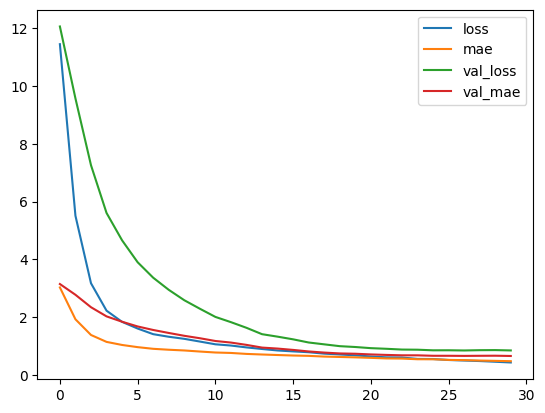

In [62]:
pd.DataFrame(model_1_hist.history).plot()

In [47]:
13910*0.8

11128.0

In [48]:
11128.0/512

21.734375

In [49]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [50]:
!cat /content/logs/train/events.out.tfevents.1723378736.7d2b91ddc708.168.0.v2

cat: /content/logs/train/events.out.tfevents.1723378736.7d2b91ddc708.168.0.v2: No such file or directory


In [63]:
pred_1 = model_1.predict(X_train_seq)

435/435 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


In [64]:
pred_1

array([[3.9724252],
       [1.0795548],
       [1.7168629],
       ...,
       [4.2456117],
       [3.7304251],
       [3.958852 ]], dtype=float32)

In [65]:
pred_1 = pred_1 + 0.5

In [66]:
pred_1 = pred_1.astype(int)

In [67]:
pred_1 = pred_1.clip(1, 5)

In [68]:
pred_1

array([[4],
       [1],
       [2],
       ...,
       [4],
       [4],
       [4]])

In [69]:
y_train.values

array([4., 1., 2., ..., 5., 5., 4.])

In [70]:
df_pred = pd.DataFrame({'y_true': y_train.values, 'pred_1': pred_1.flatten()})

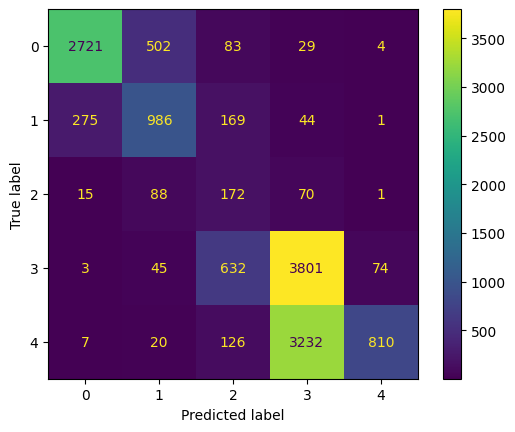

In [71]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

cm = confusion_matrix(df_pred['y_true'], df_pred['pred_1'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [72]:
y_train.value_counts()

,count
opinion_score,
4.0,4555
5.0,4195
1.0,3339
2.0,1475
3.0,346


In [73]:
df_pred['diff'] = df_pred['y_true'] - df_pred['pred_1']

In [74]:
df_pred['opinion_text'] = X_train.values

In [75]:
df_pred[df_pred['diff'] >3]

,y_true,pred_1,diff,opinion_text
11280,5.0,1,4.0,Strzyzarke Zelmer 39Z017 mam od roku czasu Uzy...
11797,5.0,1,4.0,Cena niewielka do jakości i możliwości miksera...
12329,5.0,1,4.0,Maszynka sluzyla mi prawie 4 5 roku Cena z pop...
13259,5.0,1,4.0,Do niedawna używałam pionowej wyciskarki Tefal...
13326,5.0,1,4.0,Sposob mocowania dyfuzora w odkurzaczu Bora fi...
13460,5.0,1,4.0,całkiem fajna pralka za małe piniądze wczesnie...
13758,5.0,1,4.0,Masażer Dignity ME7711 to urządzenie które pod...


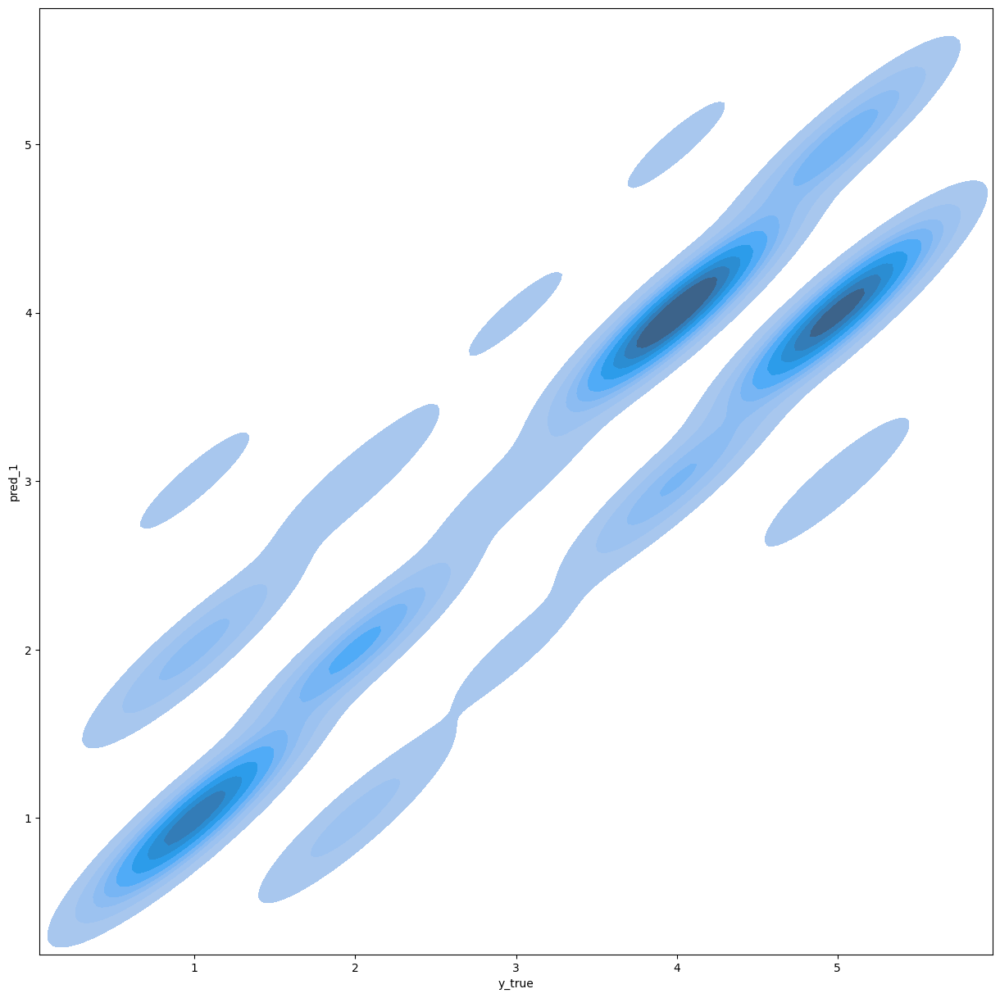

In [76]:
import seaborn as sns
from matplotlib import pyplot as plt

plt.figure(figsize=(15,15))
sns.kdeplot(data=df_pred, x='y_true', y='pred_1', fill=True)
plt.show()

<Axes: xlabel='y_true', ylabel='pred_1'>

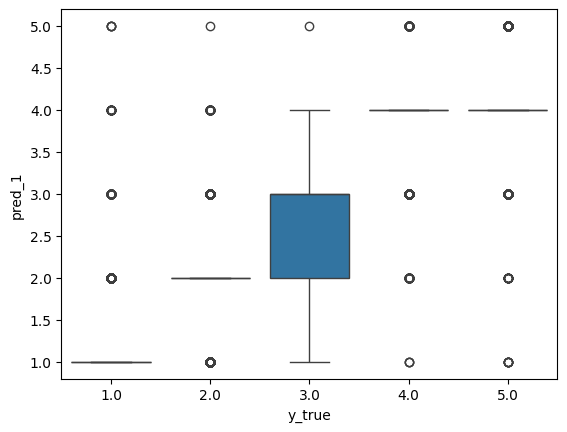

In [79]:
sns.boxplot(data=df_pred, x='y_true', y='pred_1')

In [80]:
df_melt =df_pred.melt(value_vars=['y_true', 'pred_1'])

<Axes: ylabel='value'>

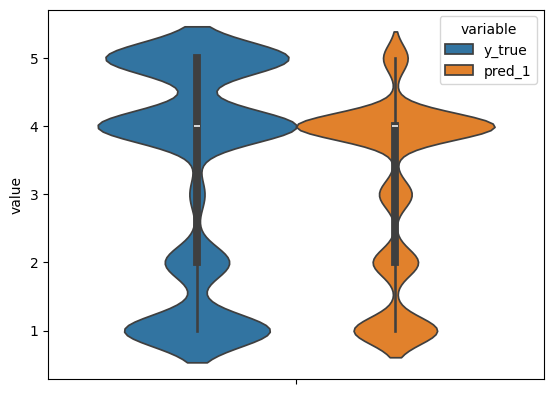

In [81]:
sns.violinplot(data=df_melt, y='value', hue='variable')

<Axes: xlabel='y_true', ylabel='pred_1'>

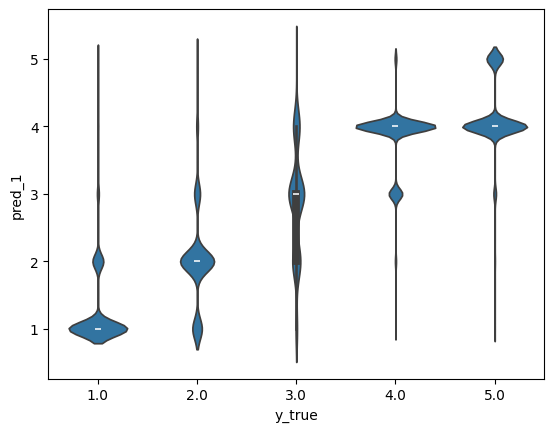

In [82]:
sns.violinplot(data=df_pred, x='y_true', y='pred_1')

In [83]:
from keras.utils import to_categorical

In [84]:
y_train_cat = to_categorical(y_train)

In [85]:
y_train_cat

array([[0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.]])

In [86]:
model_2 = keras.models.Sequential(
    [keras.layers.Dense(32, activation='relu', input_shape=(1000,)),
     keras.layers.BatchNormalization(),
     keras.layers.Dense(16, activation='relu',
                        kernel_regularizer=keras.regularizers.l2(0.001)),
     keras.layers.Dropout(0.2),
     keras.layers.Dense(16, activation='relu'),
     keras.layers.Dense(6, activation='sigmoid')]
)

model_2.compile(loss='categorical_crossentropy',
                optimizer='adam',
                metrics=['acc'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [87]:
model_2_hist = model_2.fit(X_train_seq,
                           y_train_cat,
                           epochs=20,
                           batch_size=512,
                           validation_split=0.2)
                           #callbacks=[early_stopping])

Epoch 1/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - acc: 0.2818 - loss: 1.7617 - val_acc: 0.4170 - val_loss: 1.6917
Epoch 2/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.4747 - loss: 1.3328 - val_acc: 0.4982 - val_loss: 1.5157
Epoch 3/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.5344 - loss: 1.1252 - val_acc: 0.5467 - val_loss: 1.3373
Epoch 4/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.5839 - loss: 1.0010 - val_acc: 0.5863 - val_loss: 1.2121
Epoch 5/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.6236 - loss: 0.9189 - val_acc: 0.5945 - val_loss: 1.1252
Epoch 6/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - acc: 0.6444 - loss: 0.8560 - val_acc: 0.6003 - val_loss: 1.0619
Epoch 7/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.6719 - loss: 0.8045 - val_acc: 0.6186 - val_loss: 1.0174
Epoch 8/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - acc: 0.6865 - loss: 0.7689 - val_acc: 0.6179 - val_loss: 0.9808
Epoch 9/20
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - acc: 0.7090 - loss:

<Axes: >

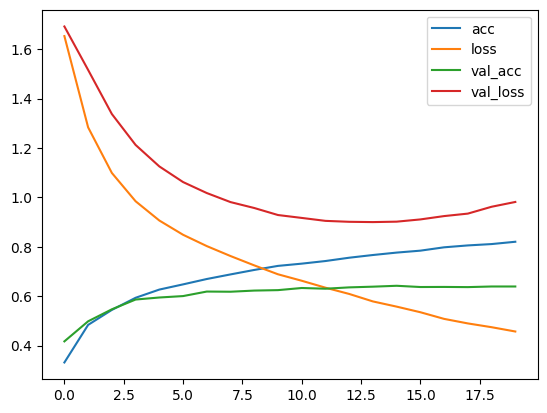

In [88]:
pd.DataFrame(model_2_hist.history).plot()

In [89]:
pred_2 = np.argmax(model_2.predict(X_train_seq), axis=1)

435/435 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


In [90]:
pred_2

array([4, 1, 2, ..., 5, 4, 4])

In [91]:
df_pred['pred_2'] = pred_2

In [92]:
df_pred

,y_true,pred_1,diff,opinion_text,pred_2
0,4.0,4,0.0,Na dzień dzisiejszy żelazko działa bez zastrze...,4
1,1.0,1,0.0,"Ma 2,5 roku. Jakość mycia poniżej przeciętnej ...",1
2,2.0,2,0.0,Zelmer stał się producentem produktów na krótk...,2
3,4.0,4,0.0,świetny,5
4,1.0,2,-1.0,"odkurzacz całkiem nieżły jak za te pieniądze, ...",1
...,...,...,...,...,...
13905,5.0,4,1.0,PRODUKT DOBRY STAN ORAZ FUNKCJONALNOSC\n\nZale...,5
13906,2.0,2,0.0,"Dobrze, że żelazko było prezentem bo zakupu by...",2
13907,5.0,4,1.0,Polecam\n\nZalety: jakość | wygląd | funkcjona...,5
13908,5.0,4,1.0,"Po wielu dniach studiowania for internetowych,...",4


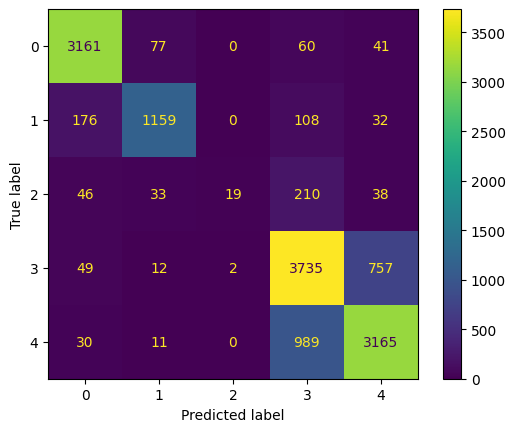

In [93]:
cm = confusion_matrix(df_pred['y_true'], df_pred['pred_2'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

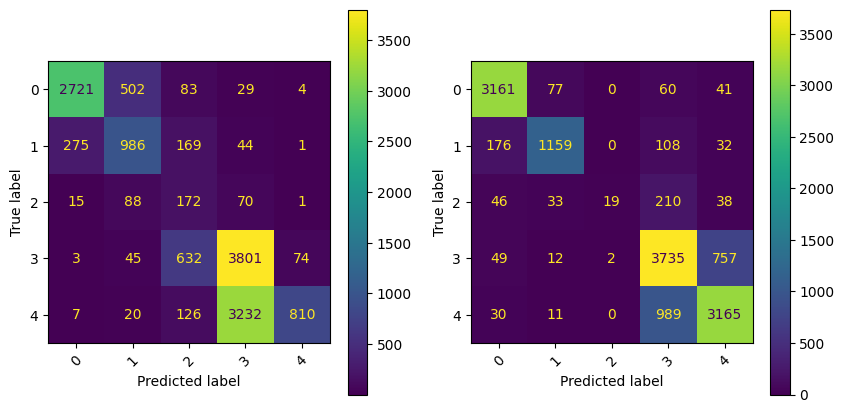

In [94]:
f, axes = plt.subplots(1, 2, figsize=(10, 5))
cm = confusion_matrix(df_pred['y_true'], df_pred['pred_1'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(ax=axes[0], xticks_rotation=45)
cm = confusion_matrix(df_pred['y_true'], df_pred['pred_2'])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(ax=axes[1], xticks_rotation=45)

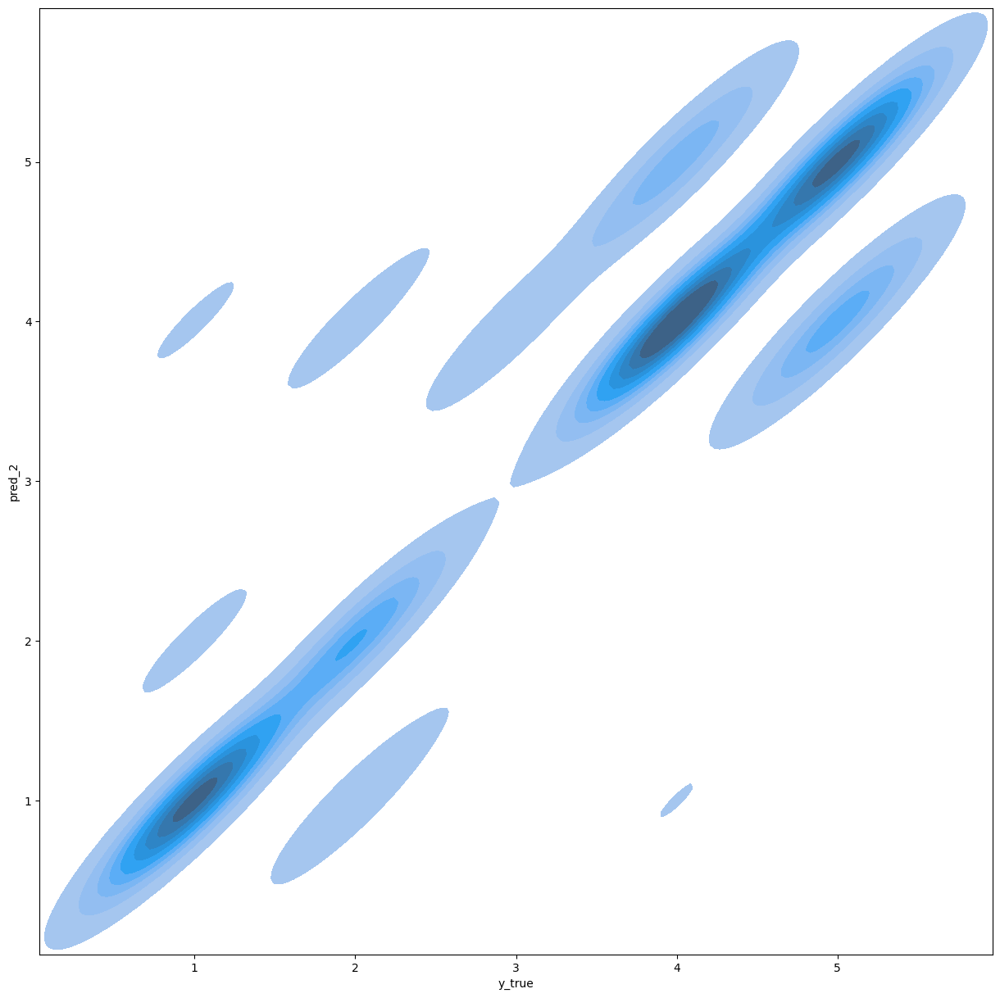

In [95]:
plt.figure(figsize=(15, 15))
sns.kdeplot(data=df_pred, x='y_true', y='pred_2', fill=True)
plt.show()

<Axes: >

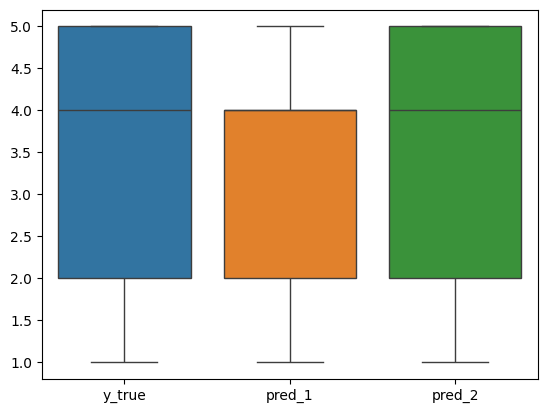

In [96]:
sns.boxplot(data=df_pred[['y_true', 'pred_1', 'pred_2']])

<Axes: xlabel='variable', ylabel='value'>

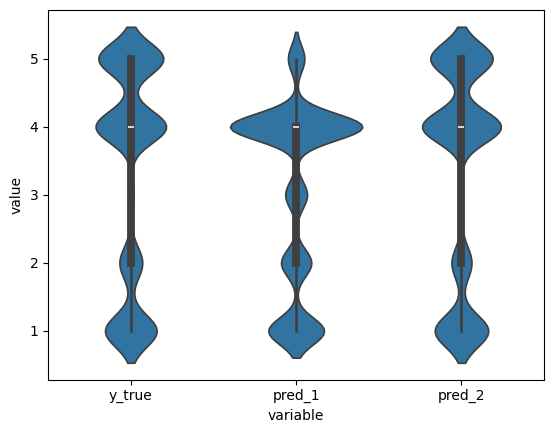

In [97]:
df_melt =df_pred.melt(value_vars=['y_true', 'pred_1', 'pred_2'])
sns.violinplot(data=df_melt, y='value', x='variable')